This tests if `forward` still works after making ControlNetXSModel savable via `register_to_config` & `save_pretrained`

In [1]:
import torch

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'mps'
device_dtype = torch.float16 if device == 'cuda' else torch.float32

## Load the model

In [3]:
from diffusers.models import AutoencoderKL
from diffusers import StableDiffusionXLPipeline

In [4]:
sdxl_pipe = StableDiffusionXLPipeline.from_single_file('weights/sdxl/sd_xl_base_1.0_0.9vae.safetensors').to(device)
sdxl_unet = sdxl_pipe.unet

beta_schedule = "scaled_linear" and beta_start=0.00085, beta_end=0.012
At the end of __init__, the sigmas are tensor([14.6146, 14.5263, 14.4386, 14.3515, 14.2651]) ...
beta_schedule = "scaled_linear" and beta_start=0.00085, beta_end=0.012
At the end of __init__, the sigmas are tensor([14.6146, 14.5263, 14.4386, 14.3515, 14.2651]) ...


In [5]:
from diffusers.models.controlnetxs import ControlNetXSModel

In [6]:
cnxs = ControlNetXSModel.from_pretrained('weights/cnxs').to(device)

In [7]:
cnxs.base_model = sdxl_unet

___

## Prepare the input to it

(Later, this will be done by the corresponding pipeline)

In [10]:
prompt = 'A turtle'

In [11]:
from diffusers.utils import load_image

In [12]:
try: original_image = load_image('https://hf.co/datasets/huggingface/documentation-images/resolve/main/diffusers/input_image_vermeer.png')
except Exception: original_image = load_image('/Users/umer/Desktop/input_image_vermeer.png')
image = original_image

I will need to use some preprocessing functions from `StableDiffusionControlNetPipeline`, so let create an instance

In [13]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

(We need a `StableDiffusionControlNetPipeline` instead of a regular `StableDiffusionPipeline` because it has a `prepare_image` method)

In [14]:
controlnet = ControlNetModel.from_pretrained('lllyasviel/sd-controlnet-canny', torch_dtype=device_dtype)
pipe = StableDiffusionControlNetPipeline.from_pretrained('runwayml/stable-diffusion-v1-5', controlnet=controlnet, torch_dtype=device_dtype).to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [15]:
guidance_scale = 7.5
do_classifier_free_guidance = guidance_scale > 1.0

In [16]:
# 2. Define call parameters
batch_size = 1 # because prompt is a single string
num_images_per_prompt  = 1

In [17]:
prompt_embeds, negative_prompt_embeds, _, _ = sdxl_pipe.encode_prompt(prompt)
prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds])
prompt_embeds.shape

torch.Size([2, 77, 2048])

In [18]:
# 6. Prepare latent variables
num_channels_latents = cnxs.base_model.config.in_channels # we're using our unet here!
num_channels_latents

4

In [19]:
# Default values for prepare_image
height, width = None, None
generator = None
latents = None
guess_mode = False

In [20]:
# 4. Prepare image
image = pipe.prepare_image(
    image=image,
    width=width,
    height=height,
    batch_size=batch_size * num_images_per_prompt,
    num_images_per_prompt=num_images_per_prompt,
    device=device,
    dtype=controlnet.dtype,
    do_classifier_free_guidance=do_classifier_free_guidance,
    guess_mode=guess_mode,
)
height, width = image.shape[-2:]
height, width, image.shape

(512, 512, torch.Size([2, 3, 512, 512]))

In [21]:
# Default values for set_timesteps
num_inference_steps = 50

In [22]:
# 5. Prepare timesteps
pipe.scheduler.set_timesteps(num_inference_steps, device=device)
timesteps = pipe.scheduler.timesteps

In [23]:
# 6. Prepare latent variables
latents = pipe.prepare_latents(
    batch_size * num_images_per_prompt,
    num_channels_latents,
    height,
    width,
    prompt_embeds.dtype,
    device,
    generator,
    latents,
)

In [24]:
latents.shape

torch.Size([1, 4, 64, 64])

In [25]:
# 8. Denoising loop
num_warmup_steps = len(timesteps) - num_inference_steps * pipe.scheduler.order

i,t = 0, timesteps[0] # NOTE: We only do 1 step for testing

In [26]:
# expand the latents if we are doing classifier free guidance
latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents
latent_model_input = pipe.scheduler.scale_model_input(latent_model_input, t)

In [27]:
# controlnet(s) inference
# guess_mode == False
control_model_input = latent_model_input
controlnet_prompt_embeds = prompt_embeds

In [28]:
latent_model_input.shape, t, prompt_embeds.shape

(torch.Size([2, 4, 64, 64]),
 tensor(981, device='mps:0'),
 torch.Size([2, 77, 2048]))

We still need the hint

In [29]:
hint_image = original_image

In [30]:
import cv2
class CannyDetector:
    def __call__(self, img, low_threshold, high_threshold):
        return cv2.Canny(img, low_threshold, high_threshold)

In [31]:
import numpy as np
def get_canny_edges(image, size=512, threshold=(50, 200)):
    image = np.array(image).astype(np.uint8)
    edges = CannyDetector()(image, *threshold)  # original sized greyscale edges
    edges = edges / 255.
    return edges

In [32]:
import matplotlib.pyplot as plt

In [33]:
edges = get_canny_edges(hint_image)

In [34]:
edges.shape

(512, 512)

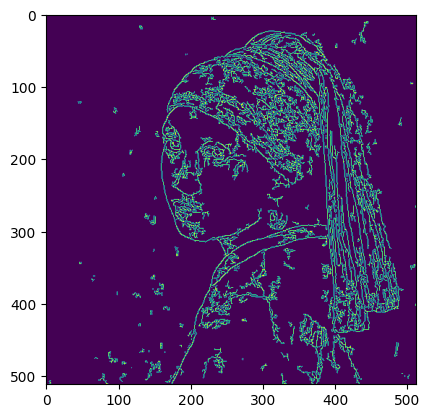

In [35]:
plt.imshow(edges);

In [36]:
num_samples=2

from einops import repeat
edges = repeat(torch.tensor(edges), 'h w -> b c h w', b=num_samples, c=3)

In [37]:
image.shape, edges.shape

(torch.Size([2, 3, 512, 512]), torch.Size([2, 3, 512, 512]))

In [38]:
x = latent_model_input
t = t
c = {}
hint = edges.to(device, dtype=device_dtype)
no_control = False

## Run the model!

In [39]:
cnxs.debug = True
result = cnxs(x, t, prompt_embeds, c, hint)

>>> >>> Start 1
1] h_base.shape: [2, 320, 64, 64]
1] h_ctrl.shape: [2, 32, 64, 64]
>>> After base->ctrl concat
1] h_ctrl.shape: [2, 352, 64, 64]
>>> After block application
1] h_base.shape: [2, 320, 64, 64]
1] h_ctrl.shape: [2, 32, 64, 64]
>>> After ctrl->base add
1] h_base.shape: [2, 320, 64, 64]
 - - - - - - - - - - - - - 
>>> >>> Start 2
2] h_base.shape: [2, 320, 64, 64]
2] h_ctrl.shape: [2, 32, 64, 64]
>>> After base->ctrl concat
2] h_ctrl.shape: [2, 352, 64, 64]
>>> After block application
2] h_base.shape: [2, 320, 64, 64]
2] h_ctrl.shape: [2, 32, 64, 64]
>>> After ctrl->base add
2] h_base.shape: [2, 320, 64, 64]
 - - - - - - - - - - - - - 
>>> >>> Start 3
3] h_base.shape: [2, 320, 64, 64]
3] h_ctrl.shape: [2, 32, 64, 64]
>>> After base->ctrl concat
3] h_ctrl.shape: [2, 352, 64, 64]
>>> After block application
3] h_base.shape: [2, 320, 32, 32]
3] h_ctrl.shape: [2, 32, 32, 32]
>>> After ctrl->base add
3] h_base.shape: [2, 320, 32, 32]
 - - - - - - - - - - - - - 
>>> >>> Start 4
4] 

In [40]:
result.sample.shape

torch.Size([2, 4, 64, 64])

**Running 1 step works!**

In [41]:
cnxs.debug = False

___

## Let's now run the denoising loop with `no_control=True`

Let's fix the random seed so we get the same results as the paper. (The paper uses `pytorch_lightning.utilities.seed.seed_everything` which is doesn't exist anymore).

In [42]:
import random
import numpy as np
import torch

def seed_everything(seed):
    # paper u
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

RANDOM_SEED_IN_PAPER = 1999158951

Let's also use the same latents as was used with the Heidelberg CVL implementation

In [43]:
latents_sdxl_cloud = torch.load('latents_cloud_no_control.pth', map_location=torch.device(device))
rand_from_cloud = latents_sdxl_cloud[0]

In [44]:
rand_from_cloud.shape

torch.Size([1, 4, 96, 96])

In [45]:
rand_from_cloud.mean(), rand_from_cloud.std()

(tensor(0.0021, device='mps:0'), tensor(14.6598, device='mps:0'))

**Note:** The seed from the cloud has 0 and 15. I seem to have downlaoded the seed *after* the scaling, so let's unscale it manually

In [46]:
rand_from_cloud /= 15

Some prep to better inspect the denoising process

In [47]:
def save_latents(i,t,lat,lats):
    if i==0 and len(lat)>0: lats = []
    lats.append((i,t,lat))

from PIL import Image, ImageOps, ImageDraw
from tqdm.notebook import tqdm
from functools import partial

def lat2img(lat, resize_to=None, output_type='pil'):
    with torch.no_grad():
        ims = cnxs_pipe.vae.decode(lat / cnxs_pipe.vae.config.scaling_factor, return_dict=False)[0]
        ims = cnxs_pipe.image_processor.postprocess(ims, output_type=output_type)
        if resize_to is not None:
            if output_type=='pil': ims = [im.resize(resize_to) for im in ims]
            else: print(f'Not resizing as output_type = {output_type} requested')
    return ims

def only_lat(o): return o[-1] if isinstance(o,tuple) else o
def lats2imgs(lats, resize_to=None, output_type='pil',pbar=True):
    if pbar: lats = tqdm(lats)
    ims = [lat2img(only_lat(lat), resize_to, output_type) for lat in lats]
    if output_type=='pt': ims = [im.cpu() for im in ims]
    return ims

real_idx = None
def plot_latents_to_pil_grid(lats, every=5, cols=7, im_size=(300, 300), pbar=True, border=2, return_ims=True, output_type='pil'):
    global real_idx
    
    real_idx = partial(lambda o,every,total: min(total-1,every*o), every=every, total=len(lats))
    
    titles = [f'Image {i}' for i, _, _ in lats if i % every == 0 or i == len(lats)-1]
    lats = [lat for i, _, lat in lats if i % every == 0 or i == len(lats)-1]
    if pbar: lats = tqdm(lats)
    ims = [lat2img(lat, resize_to=im_size, output_type=output_type)[0] for lat in lats]
    ims_bordered = [ImageOps.expand(im, border=2, fill='black') for im in ims]
    im_size = (im_size[0]+border, im_size[1]+border)

    rows = len(ims) // cols
    if rows * cols < len(ims): rows += 1

    grid_image = Image.new('RGB', (cols * im_size[0], rows * im_size[1]), color='grey')
    # draw diagonal white lines
    draw = ImageDraw.Draw(grid_image)
    for xy in range(0,2*max(cols * im_size[0], rows * im_size[1])+1,100):
        draw.line([(xy, 0), (0, xy)], fill="white", width=1)
    
    for i, img in enumerate(ims_bordered):
        x_offset = (i % cols) * im_size[0]
        y_offset = (i // cols) * im_size[1]
        grid_image.paste(img, (x_offset, y_offset))

    if return_ims: return grid_image, ims
    else: return grid_image

Okay, let's go

In [48]:
prompt = 'cinematic, shoe in the streets, made from meat, photorealistic shoe, highly detailed'
neg_prompt = 'lowres, bad anatomy, worst quality, low quality'

In [49]:
image = load_image('input_images/shoe.png')
edges = get_canny_edges(image)

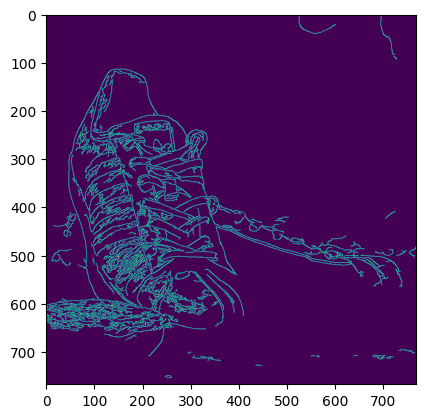

In [50]:
plt.imshow(edges)

In [51]:
cnxs.no_control = True

In [52]:
from diffusers.pipelines.controlnet_xs.pipeline_controlnet_xs_sd_xl import StableDiffusionXLControlNetXSPipeline

In [53]:
cnxs_pipe = StableDiffusionXLControlNetXSPipeline(
    vae=sdxl_pipe.vae,
    text_encoder=sdxl_pipe.text_encoder,
    text_encoder_2=sdxl_pipe.text_encoder_2,
    tokenizer=sdxl_pipe.tokenizer,
    tokenizer_2=sdxl_pipe.tokenizer_2,
    unet=sdxl_pipe.unet,
    controlnet=cnxs,
    scheduler=sdxl_pipe.scheduler,
)

In [54]:
# takes ~3min to run on cpu / ~1.5min on mps
seed_everything(RANDOM_SEED_IN_PAPER)
lats_sdxl_unfixed_noise = []
result_unfixed_noise = cnxs_pipe(
    prompt, negative_prompt=neg_prompt,image=edges,
    callback=partial(save_latents, lats=lats_sdxl_unfixed_noise),
)

timestep_spacing = "leading" and timesteps=[981. 961. 941. 921. 901.] ...
sigmas before interpolation: [0.02916753 0.04131448 0.05068044 0.05861427 0.06563709] ...
sigmas after (linear) interpolation: [13.12041569 11.67605019 10.42504501  9.33807945  8.39068699] ...
At end of `set_timesteps`:
sigmas =  tensor([13.1204, 11.6761, 10.4250,  9.3381,  8.3907], device='mps:0') ...
timesteps = tensor([981., 961., 941., 921., 901.], device='mps:0') ...
No latents passed in
initial_unscaled_latents:  tensor([ 1.1883,  1.1815,  0.0892, -0.8828, -0.6893], device='mps:0')
latents:  tensor([ 15.6361,  15.5467,   1.1739, -11.6158,  -9.0706], device='mps:0')


  0%|          | 0/50 [00:00<?, ?it/s]

In [55]:
# takes ~3min to run on cpu / ~1.5min on mps
seed_everything(RANDOM_SEED_IN_PAPER)
lats_sdxl = []
result = cnxs_pipe(
    prompt, negative_prompt=neg_prompt,image=edges,
    callback=partial(save_latents, lats=lats_sdxl),
    latents=rand_from_cloud,
)

timestep_spacing = "leading" and timesteps=[981. 961. 941. 921. 901.] ...
sigmas before interpolation: [0.02916753 0.04131448 0.05068044 0.05861427 0.06563709] ...
sigmas after (linear) interpolation: [13.12041569 11.67605019 10.42504501  9.33807945  8.39068699] ...
At end of `set_timesteps`:
sigmas =  tensor([13.1204, 11.6761, 10.4250,  9.3381,  8.3907], device='mps:0') ...
timesteps = tensor([981., 961., 941., 921., 901.], device='mps:0') ...
Passed in latents:  tensor([ 1.2990,  0.5023,  0.4527, -0.5207,  0.9843], device='mps:0')
initial_unscaled_latents:  tensor([ 1.2990,  0.5023,  0.4527, -0.5207,  0.9843], device='mps:0')
latents:  tensor([17.0935,  6.6089,  5.9572, -6.8510, 12.9513], device='mps:0')


  0%|          | 0/50 [00:00<?, ?it/s]

In [56]:
type(result), type(result.images[0])

(diffusers.pipelines.stable_diffusion_xl.pipeline_output.StableDiffusionXLPipelineOutput,
 PIL.Image.Image)

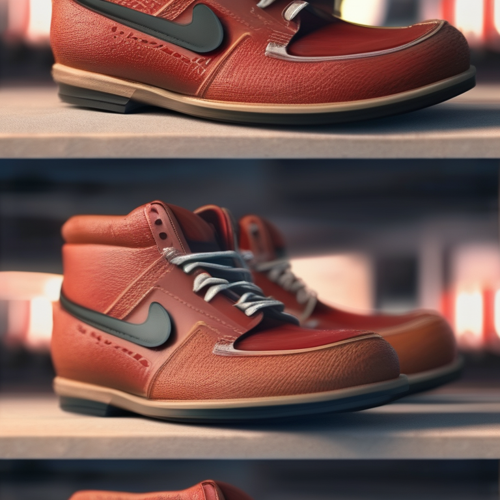

In [57]:
result.images[0].resize((500,500))

**It works!**

This is SDXL without noise fixing (the seed is fixed though)

  0%|          | 0/10 [00:00<?, ?it/s]

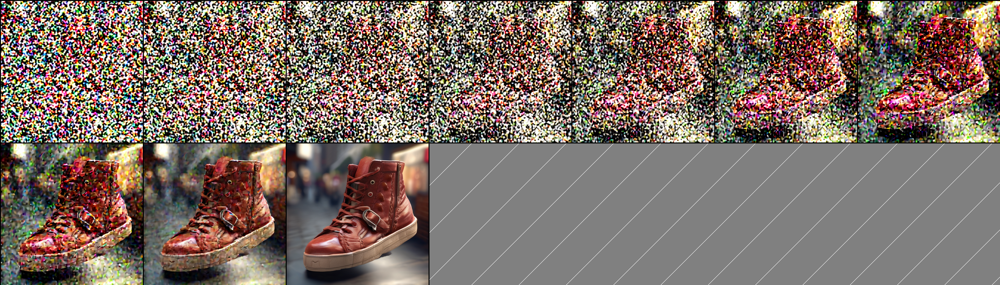

In [58]:
grid, ims_sdxl = plot_latents_to_pil_grid(lats_sdxl_unfixed_noise)
grid

This is SDXL with the same noise as on the cloud

  0%|          | 0/10 [00:00<?, ?it/s]

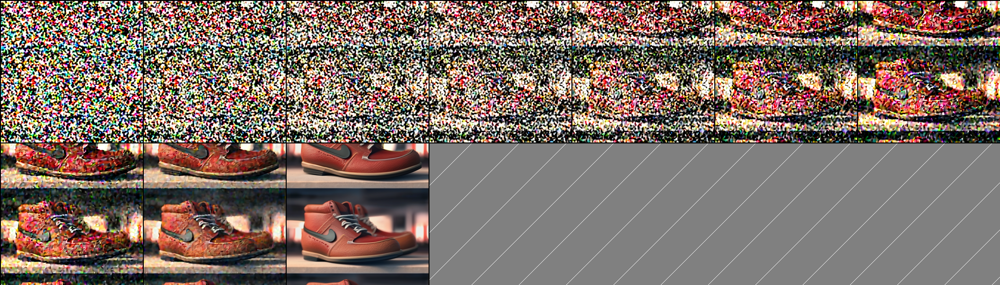

In [59]:
grid, ims_sdxl = plot_latents_to_pil_grid(lats_sdxl)
grid

These are results from the cloud (SDXL run on cloud, only latents decoded here)

  0%|          | 0/11 [00:00<?, ?it/s]

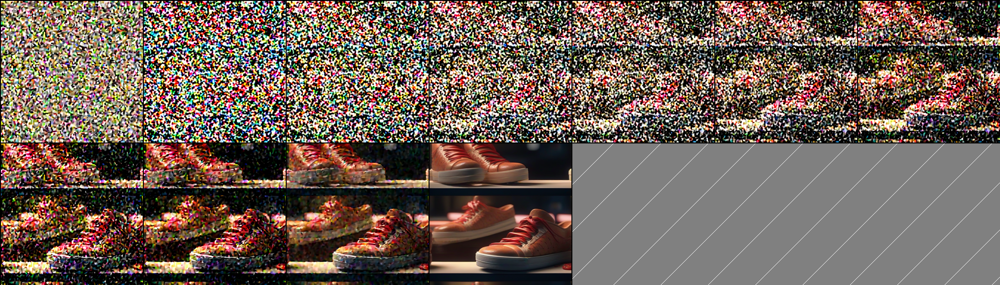

In [60]:
def package_latents_from_cloud(lats): return [(i,None,l) for i,l in enumerate(lats)]

grid, _ = plot_latents_to_pil_grid(package_latents_from_cloud(latents_sdxl_cloud), every=1)
grid

In [61]:
sdxl_pipe.scheduler

EulerDiscreteScheduler {
  "_class_name": "EulerDiscreteScheduler",
  "_diffusers_version": "0.22.0.dev0",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "interpolation_type": "linear",
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "sample_max_value": 1.0,
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "timestep_spacing": "leading",
  "trained_betas": null,
  "use_karras_sigmas": false
}

In [62]:
sdxl_pipe.scheduler.compatibles

[diffusers.schedulers.scheduling_ddpm.DDPMScheduler,
 diffusers.utils.dummy_torch_and_scipy_objects.LMSDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_ancestral_discrete.KDPM2AncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_unipc_multistep.UniPCMultistepScheduler,
 diffusers.utils.dummy_torch_and_torchsde_objects.DPMSolverSDEScheduler,
 diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_discrete.KDPM2DiscreteScheduler,
 diffusers.schedulers.scheduling_pndm.PNDMScheduler,
 diffusers.schedulers.scheduling_euler_discrete.EulerDiscreteScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler,
 diffusers.schedulers.scheduling_deis_multistep.DEISMultist

In [65]:
assert False

AssertionError: 

## Let's now run the denoising loop with control

In [63]:
cnxs.no_control = False

In [64]:
# RuntimeError: Given ... expected input [2, 1, 512, 512] to have 3 channels, but got 1 channels instead
# -> hint has 1 channel, but should have 3
# let'cheat
edges_tensor = torch.tensor(edges)
three_edges = torch.stack((edges_tensor,edges_tensor,edges_tensor))
three_edges.shape

torch.Size([3, 768, 768])

In [65]:
# # Produces shape mismatch at h_ctrl += guided_hint of [2, 32, 64, 64] != [4, 32, 64, 64]
# # As cnxs.forward did run, I assume the error is due to negative prompting. Maybe it's double the inputs from 2 -> 4
# # (Altough it shouldn't. We should have 3 inputs: uncond, cond, neg.)
seed_everything(RANDOM_SEED_IN_PAPER)
lats_cnxs = []
result_controlled = cnxs_pipe(prompt, negative_prompt=neg_prompt,image=three_edges, callback=partial(save_latents, lats=lats_cnxs))

timestep_spacing = "leading" and timesteps=[981. 961. 941. 921. 901.] ...
sigmas before interpolation: [0.02916753 0.04131448 0.05068044 0.05861427 0.06563709] ...
sigmas after (linear) interpolation: [13.12041569 11.67605019 10.42504501  9.33807945  8.39068699] ...
At end of `set_timesteps`:
sigmas =  tensor([13.1204, 11.6761, 10.4250,  9.3381,  8.3907], device='mps:0') ...
timesteps = tensor([981., 961., 941., 921., 901.], device='mps:0') ...
No latents passed in
initial_unscaled_latents:  tensor([ 1.1883,  1.1815,  0.0892, -0.8828, -0.6893], device='mps:0')
latents:  tensor([ 15.6361,  15.5467,   1.1739, -11.6158,  -9.0706], device='mps:0')


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

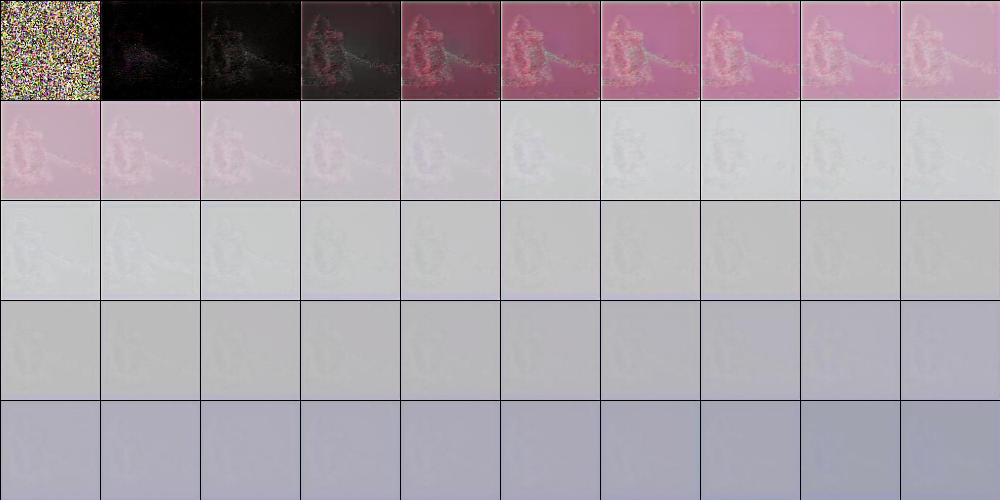

In [66]:
grid, ims_cnxs = plot_latents_to_pil_grid(lats_cnxs, every=1, cols=10, im_size=(200,200)) 
grid

**1.** In the 2nd (=10th) image I can see the contour of the shoe as in the guidance image. But over time, the image get's destroyed.<br/>
**2.** The 1st (=5th) image looks extremely weird.

**Q:** Why is 2nd image so dark? Are the averages predicted noises between sdxl / cnxs different?

**Hypothesis re 1:** The image vanishes when using cnxs, because it gets pushed outside the (0,1) boundary. This might becaise I need to rescale the noise prediceted by cnxs (which I currently don't do).

In [ ]:
def percentage_outside_range(x, lo=0,hi=1):
    x = np.array(x).flatten()
    return (np.sum(x<lo)+np.sum(x>hi))/len(x)

for inp,res in (([3],1),([1],0),([[0,0],[-0.5,2]],0.5)): assert percentage_outside_range(inp)==res

Because the conversion to PIL clamsp the images to `(0,255)` (which corresponds to `(0,1)` in numpy), we need do `lats2imgs` again with `output_type='pt'`

In [ ]:
ims_cnxs_pt = lats2imgs(lats_cnxs,output_type='pt')

for i,im in enumerate(ims_cnxs_pt):
    p = percentage_outside_range(im)
    print(f'Step {real_idx(i)}] {p:.2f} of values outside range')

**A:** No, the values are all in `(0,1)`

Hmm, but at least image 0 had values < 0! I saw that yesterday. Where are they?